# Projet Python 2A

## Importation des modules et packages

In [2]:
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 

In [3]:
import requests 

In [4]:
import urllib
import bs4
import pandas as pd
from urllib import request
import re

In [4]:
!pip install lxml

## Récupération des données 

### WebScrapping des noms de films sur Wikipédia 

On stocke tous les noms des films présents sur cette page dans une liste que l'on appelle Liste_films.
On modifie le format de certains titre : ' XXX (1967)' devient ' XXX '
Finalement, on récupère la longueur de la liste : elle est de ≈ 1500. 

In [5]:
response = requests.get(
	url="https://en.wikipedia.org/wiki/List_of_years_in_film",
)
soup = bs4.BeautifulSoup(response.content, 'html.parser')

title = soup.find(id="firstHeading")
print(title.string)

List of years in film


In [6]:
all_names= soup.findAll("i")
L=[]
for link in all_names :
    t=link.findAll('a')
    if len(t)!=0:
        r=t[0]['title']
        L.append(r)
# print(L)


In [7]:
import re

In [8]:
# on enlève les précisions entre parenthèses 

Liste_films= []
for i in L: 
    Liste_films.append(re.sub("\(.*?\)","()",i).replace("()",""))
#print(L2)
len(Liste_films)

1532

In [9]:
#Liste_films

In [10]:
!pip install tmdb3
!pip install tmdbv3api

### Utilisation d'une API pour récupérer l'identifiant des films à partir de leur titre

On utilise l'API: The Movie Database API (TMDB API) pour laquelle j'ai du faire une demande de clé : api_key
On place ces identifiants dans une liste index.

#### CAS PARTICULIER : on fixe le nom du film

In [11]:
# on va utiliser une première requête d'API pour accéder aux ID des films scrappés sur Wikipédia
api_key='28c6630049f5d468217e4f34963c03a6' #clé de l'API 
nom_du_film='Earth '

url_api=f"https://api.themoviedb.org/3/search/movie?api_key={api_key}&query={nom_du_film}" 
#requête pour trouver les infos ayant le nom_du_film en title 
req = requests.get(url_api)
wb = req.json()


# on récupère tous les indexs des films en question 
index=[]
for film in range(len(wb['results'])):
    index.append(wb['results'][film]['id'])
index  

[811367,
 82700,
 443297,
 347111,
 10946,
 11569,
 5491,
 85949,
 55420,
 641370,
 31642,
 748853,
 68179,
 197624,
 339,
 238603,
 10176,
 88751,
 685607,
 13363]

### Généralisation à partir d'un nom on récupère les identifiants

In [191]:
api_key='28c6630049f5d468217e4f34963c03a6' #clé de l'API 

def get_id(nom):
    url_api=f"https://api.themoviedb.org/3/search/movie?api_key={api_key}&query={nom}" 
    #requête pour trouver les infos ayant le nom_du_film en title 
    req = requests.get(url_api)
    wb = req.json()


    # on récupère tous les indexs des films en question 
    index=[]
    for film in range(len(wb['results'])):
        index.append(wb['results'][film]['id'])
    return(index)


### Récupération du détail des données grâce à une autre API 

Toujours sur TMDB API, on utilise cette fois l'id du film pour accéder à un grand nombre de données sur ce film : get detail. 
Pour cela on fait appel à la fonction précédente qui nous donnait les id correspondant au titre du film. 
On ajuste le format des données pour que les tailles des éléments nous permettent de convertir le dictionnaire
en DataFrame pandas. 

In [271]:
def df_avec_id(id):
    id_film= id
    url_new_api = f"https://api.themoviedb.org/3/movie/{id_film}?api_key={api_key}&language=en-US"
    req_new = requests.get(url_new_api)
    wb_new = req_new.json()
    
    
    #ajustement des données 
    if wb_new['belongs_to_collection']!=None: 
        wb_new['belongs_to_collection']=wb_new['belongs_to_collection']['name']
        
    wb_new['genres']=' , '.join([x['name'] for x in wb_new['genres']]) #on ne sélectionne que le nom des genres 
    wb_new['production_companies']=' , '.join([x['name'] for x in wb_new['production_companies']]) #on ne sélectionne que les noms (même pas les pays)
    wb_new['production_countries']=' , '.join([x['name'] for x in wb_new['production_countries']])
    wb_new['spoken_languages']=' , '.join([x['name'] for x in wb_new['spoken_languages']])
    
    df=pd.DataFrame(wb_new, index=[wb_new['id']])  #j'ai mis l'ID en index mais on peut aussi indexer à partie de 0
    # pour cela, on met index=[0]
    
    return (df)

In [155]:
from tqdm import tqdm

### Généralisation et concaténation

On utilise les deux fonctions précédentes pour créer notre DataFrame all. 
On parcourt la liste des titres puis la liste des id pour chacun des films. 
On a donc une double-boucle for, ce qui s'avère couteux mais qui fonctionne au bout d'1h30. 

Un axe d'amélioration serait de réduire le temps pour cette collecte de données. 


In [282]:
def concat_all(liste):
    Liste_fail=[]
    
    DF_ALL=pd.DataFrame()
    for nom in tqdm(liste):
        #print(nom)
        ind=get_id(nom)
        for i in ind:
            try:
                df_2=df_avec_id(i)
                #print(df_2.budget)
                if df_2['budget'].all()>0:
                    DF_ALL=pd.concat([DF_ALL,df_2],axis=0)
                    
            except ValueError:
                Liste_fail.append([nom,i])
    print(Liste_fail)
    return DF_ALL

In [285]:
from scipy import *

In [293]:
def concat_all_2(liste):
    Liste_fail=[]
    DF_ALL=pd.DataFrame()
    for nom in tqdm(liste):
        #print(nom)
        ind=get_id(nom)
        f_vect(ind)
    print(Liste_fail)
    return DF_ALL

In [294]:
def fonction_int(id):
    try:
                df_2=df_avec_id(id)
                #print(df_2.budget)
                if df_2['budget'].all()>0:
                    return(pd.DataFrame())
                    
    except ValueError:
                Liste_fail.append(id)
            

f_vect = vectorize(fonction_int)

In [ ]:
l=Liste_films
a=concat_all(l)

 65%|██████▍   | 990/1532 [36:19<09:18,  1.03s/it]  

In [280]:
a.head(20)

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
624860,False,/eNI7PtK6DEYgZmHWP9gQNuff8pv.jpg,The Matrix Collection,190000000,"Science Fiction , Action , Adventure",https://www.whatisthematrix.com,624860,tt10838180,en,The Matrix Resurrections,...,2021-12-16,156497322,148,English,Released,Return to the source.,The Matrix Resurrections,False,6.595,4249
603,False,/l4QHerTSbMI7qgvasqxP36pqjN6.jpg,The Matrix Collection,63000000,"Action , Science Fiction",http://www.warnerbros.com/matrix,603,tt0133093,en,The Matrix,...,1999-03-30,463517383,136,English,Released,Welcome to the Real World.,The Matrix,False,8.193,22273
604,False,/pxK1iK6anS6erGg4QePmMKbB1E7.jpg,The Matrix Collection,150000000,"Adventure , Action , Thriller , Science Fiction",,604,tt0234215,en,The Matrix Reloaded,...,2003-05-15,738599701,138,English,Released,Free your mind.,The Matrix Reloaded,False,7.025,9378
605,False,/533xAMhhVyjTy8hwMUFEt5TuDfR.jpg,The Matrix Collection,150000000,"Adventure , Action , Thriller , Science Fiction",,605,tt0242653,en,The Matrix Revolutions,...,2003-11-05,424988211,129,"English , Français",Released,Everything that has a beginning has an end.,The Matrix Revolutions,False,6.700,8425
13764,False,/xLDSKsyAGFFCNYDmNynEOsms5jp.jpg,None,50000000,"Family , Fantasy , Adventure",,13764,tt0089961,en,Santa Claus: The Movie,...,1985-10-29,23717291,108,English,Released,Guess who's coming to town!,Santa Claus: The Movie,False,6.281,202
32307,False,/jRtMuANI62nS0oOEcKyewhizFFr.jpg,None,200000,"Comedy , Fantasy , Science Fiction",,32307,tt0058548,en,Santa Claus Conquers the Martians,...,1964-11-14,0,81,English,Released,,Santa Claus Conquers the Martians,False,3.100,99
399121,False,/jArl1j9sL2mYjRW23EaZKWAr2E8.jpg,None,25300000,"History , Drama , Thriller",,399121,tt2398149,fr,J'accuse,...,2019-09-30,18878646,132,Français,Released,,An Officer and a Spy,False,7.089,1277
15157,False,/bR0GpnGUCN7uxRmXtnJr9s19Jrb.jpg,Cinderella Story Collection,5000000,"Comedy , Music",http://anothercinderellastory.warnerbros.com/,15157,tt1071358,en,Another Cinderella Story,...,2008-09-16,0,90,English,Released,Once upon a time....can happen again.,Another Cinderella Story,False,6.801,1572
11224,False,/puJKgNcWaGgMk5VHanSSomUTpmw.jpg,Cinderella Collection,2900000,"Family , Fantasy , Animation , Romance",http://movies.disney.com/cinderella-1950,11224,tt0042332,en,Cinderella,...,1950-02-22,263591415,74,English,Released,The greatest love story ever told.,Cinderella,False,7.035,5834
150689,False,/q7vmCCmyiHnuKGMzHZlr0fD44b9.jpg,None,95000000,"Romance , Fantasy , Family , Drama",http://movies.disney.com/cinderella,150689,tt1661199,en,Cinderella,...,2015-03-12,543514353,105,English,Released,Midnight is just the beginning.,Cinderella,False,6.802,6374


In [145]:
df_avec_id(111332)

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
111332,False,/uEwGFGtao9YG2JolmdvtHLLVbA9.jpg,None,0,Documentary,,111332,tt1599280,en,Avatar: Creating the World of Pandora,...,2010-02-07,0,23,English,Released,,Avatar: Creating the World of Pandora,False,7.442,26


https://developers.themoviedb.org/3/people/get-person-details

In [146]:
df_all=df_avec_id(index[0]) #initialisation

for i in index[1:]: 
    print(i)
    df_2= df_avec_id(i)
    df_all=pd.concat([df_all,df_2],axis=0)
df_all

    

76600
111332
287003
216527
83533
393209
278698
183392
287004
993545
931019
740017
668297
424768
348369
874770
812836
613200
100287


,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
19995,False,/7ABsaBkO1jA2psC8Hy4IDhkID4h.jpg,Avatar Collection,237000000,"Action , Adventure , Fantasy , Science Fiction",https://www.avatar.com/movies/avatar,19995,tt0499549,en,Avatar,...,2009-12-15,2920357254,162,"English , Español",Released,Enter the world of Pandora.,Avatar,False,7.526,26416
76600,False,/198vrF8k7mfQ4FjDJsBmdQcaiyq.jpg,Avatar Collection,250000000,"Science Fiction , Action , Adventure",https://www.avatar.com/movies/avatar-the-way-o...,76600,tt1630029,en,Avatar: The Way of Water,...,2022-12-14,0,0,English,Post Production,,Avatar: The Way of Water,False,0.000,0
111332,False,/uEwGFGtao9YG2JolmdvtHLLVbA9.jpg,None,0,Documentary,,111332,tt1599280,en,Avatar: Creating the World of Pandora,...,2010-02-07,0,23,English,Released,,Avatar: Creating the World of Pandora,False,7.442,26
287003,False,None,None,0,Documentary,,287003,None,en,Avatar: Scene Deconstruction,...,2009-12-18,0,0,,Released,,Avatar: Scene Deconstruction,False,8.300,10
216527,False,None,Avatar Collection,250000000,"Action , Science Fiction , Adventure , Fantasy",https://www.avatar.com/movies,216527,tt3095356,en,Avatar 4,...,2026-12-16,0,0,English,In Production,,Avatar 4,False,0.000,0
83533,False,None,Avatar Collection,250000000,"Action , Drama , Science Fiction , Adventure ,...",https://www.avatar.com/movies,83533,tt1757678,en,Avatar 3,...,2024-12-18,0,0,English,Post Production,,Avatar 3,False,0.000,0
393209,False,None,Avatar Collection,250000000,"Action , Adventure , Fantasy , Science Fiction",https://www.avatar.com/movies,393209,tt5637536,en,Avatar 5,...,2028-12-20,0,0,English,In Production,,Avatar 5,False,0.000,0
278698,False,None,None,0,Documentary,,278698,tt1900832,en,Avatar Spirits,...,2010-06-22,0,32,English,Released,"In 2002, two friends set out to create a groun...",Avatar Spirits,False,9.000,14
183392,False,/2YdWh0vZ3iMV9MP5ntRVj23ei65.jpg,None,0,Documentary,http://www.avatarmovie.com,183392,tt1778212,en,Capturing Avatar,...,2010-11-16,0,98,English,Released,,Capturing Avatar,False,7.806,36
287004,False,None,None,0,,,287004,,en,Avatar: Production Materials,...,2009-12-18,0,0,English,Released,,Avatar: Production Materials,True,6.000,3


In [5]:
!pip install pandas_profiling 
!pip install ipywidgets
from pandas_profiling import ProfileReport

In [6]:
df=pd.read_csv('ProjetFilms.csv')

In [7]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
import seaborn as sns

<AxesSubplot:xlabel='revenue', ylabel='Count'>

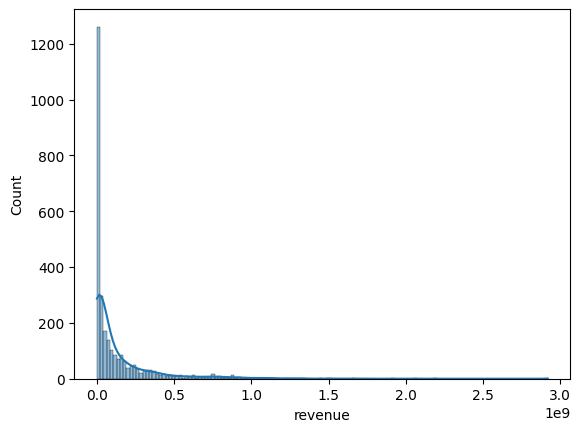

In [18]:
sns.histplot(data=df.revenue, kde=True)

In [7]:
df_bis=df[df.revenue!=0]

<AxesSubplot:xlabel='revenue', ylabel='Count'>

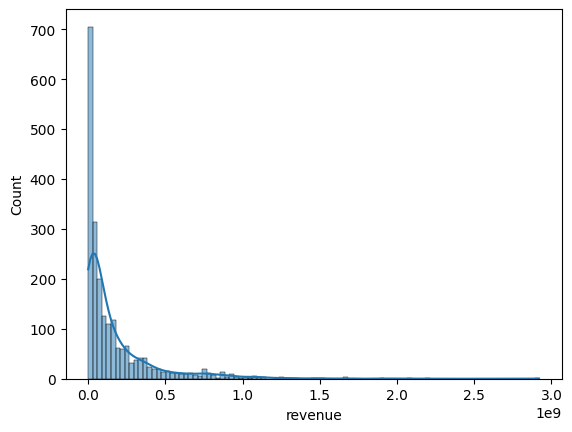

In [32]:
sns.histplot(data=df_bis.revenue, kde=True)

On préfère regarder la répartition avec une échelle log car on a des écarts de budget qui se comptent en puissances de 10

<AxesSubplot:xlabel='revenue', ylabel='Count'>

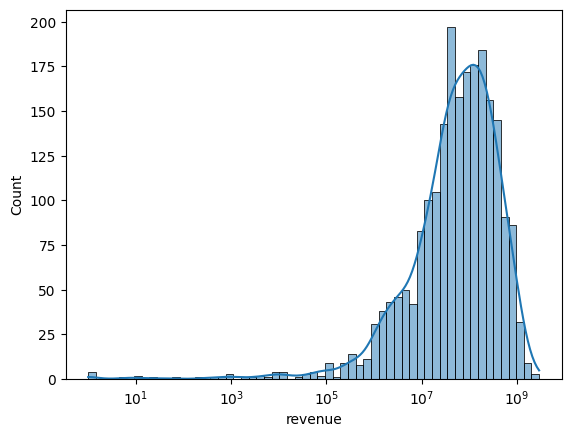

In [29]:
sns.histplot(data=df_bis.revenue, log_scale=True, kde=True)

## Résolution des problèmes du dataset 

#### Genres 
On va créer pour chaque genre une variable "nom du genre" qui vaudra 1 si le film appartient à ce genre et 0 sinon. 
Cela permettra de résoudre le pb de la multiappartenance 

#### Nationalité 
On fait de même qu'avec les genres 

#### Saga 
Créer une variable 1 ou 0 


### Genres

In [8]:
Liste_genres= df_bis['genres'].unique()

In [9]:
p = re.compile(r'\W+')

Liste_finale=[]

for i in Liste_genres : 
    #print(str(i))
    sous_liste= p.split(str(i))
    for j in sous_liste :
        Liste_finale.append(j)
        
Liste_finale = np.unique(Liste_finale)     
#Liste_finale

In [10]:
def TrouverLeMot(mot, ExpressionToTest):
    pattern = re.compile(mot)
    if pattern.search(ExpressionToTest)== None:
        return(0)
    else : 
        return(1)

In [11]:
for genre in Liste_finale:
    df_bis[genre]= df_bis['genres'].apply(lambda x: TrouverLeMot(str(genre),str(x)))
df_bis

/var/folders/ls/kz9r5k393xg8d3p1krqjx50m0000gn/T/ipykernel_20157/1002378360.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bis[genre]= df_bis['genres'].apply(lambda x: TrouverLeMot(str(genre),str(x)))
/var/folders/ls/kz9r5k393xg8d3p1krqjx50m0000gn/T/ipykernel_20157/1002378360.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bis[genre]= df_bis['genres'].apply(lambda x: TrouverLeMot(str(genre),str(x)))
/var/folders/ls/kz9r5k393xg8d3p1krqjx50m0000gn/T/ipykernel_20157/1002378360.py:2: SettingWithC

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,Movie,Music,Mystery,Romance,Science,TV,Thriller,War,Western,nan
0,False,/eNI7PtK6DEYgZmHWP9gQNuff8pv.jpg,The Matrix Collection,190000000,"Science Fiction , Action , Adventure",https://www.whatisthematrix.com,624860,tt10838180,en,The Matrix Resurrections,...,0,0,0,0,1,0,0,0,0,0
1,False,/l4QHerTSbMI7qgvasqxP36pqjN6.jpg,The Matrix Collection,63000000,"Action , Science Fiction",http://www.warnerbros.com/matrix,603,tt0133093,en,The Matrix,...,0,0,0,0,1,0,0,0,0,0
2,False,/pxK1iK6anS6erGg4QePmMKbB1E7.jpg,The Matrix Collection,150000000,"Adventure , Action , Thriller , Science Fiction",NaN,604,tt0234215,en,The Matrix Reloaded,...,0,0,0,0,1,0,1,0,0,0
3,False,/533xAMhhVyjTy8hwMUFEt5TuDfR.jpg,The Matrix Collection,150000000,"Adventure , Action , Thriller , Science Fiction",NaN,605,tt0242653,en,The Matrix Revolutions,...,0,0,0,0,1,0,1,0,0,0
4,False,/xLDSKsyAGFFCNYDmNynEOsms5jp.jpg,NaN,50000000,"Family , Fantasy , Adventure",NaN,13764,tt0089961,en,Santa Claus: The Movie,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2848,False,/hUPgIibqZlwbhs4N08cPzzc4f5K.jpg,X-Men Collection,250000000,"Action , Adventure , Science Fiction",https://www.20thcenturystudios.com/movies/x-me...,127585,tt1877832,en,X-Men: Days of Future Past,...,0,0,0,0,1,0,0,0,0,0
2849,False,/2ZuNdBOSUamCo6mU1Ew1KEaN8Zc.jpg,The X Files Collection,66000000,"Mystery , Science Fiction , Thriller",NaN,846,tt0120902,en,The X Files,...,0,0,1,0,1,0,1,0,0,0
2850,False,/kC0QK1s6kx6jTxzPPaWwo3BRRr6.jpg,NaN,18000000,"Drama , Comedy",NaN,18410,tt0093793,en,Project X,...,0,0,0,0,0,0,0,0,0,0
2851,False,/4JO4qqCWh5BAfFwphC7ZAnhsM0.jpg,F/X Collection,10000000,"Action , Thriller",NaN,9873,tt0089118,en,F/X,...,0,0,0,0,0,0,1,0,0,0


### Production countries 

In [12]:
Liste_pays_prod= df_bis['production_countries'].unique()

In [13]:
Liste_finale=[]

for i in Liste_pays_prod : 
    #print(str(i))
    sous_liste= re.split(' ; | , ', str(i))
    for j in sous_liste :
        Liste_finale.append(j)
        
Liste_finale = np.unique(Liste_finale)     
Liste_finale

array(['Algeria', 'Argentina', 'Australia', 'Austria', 'Bahamas',
       'Belgium', 'Botswana', 'Brazil', 'Bulgaria', 'Canada', 'China',
       'Colombia', 'Cyprus', 'Czech Republic', 'Denmark', 'Estonia',
       'Finland', 'France', 'Germany', 'Greece', 'Hong Kong', 'Hungary',
       'India', 'Iran', 'Ireland', 'Israel', 'Italy', 'Japan', 'Lebanon',
       'Libyan Arab Jamahiriya', 'Luxembourg', 'Malta', 'Mexico',
       'Morocco', 'Netherlands', 'New Zealand', 'Norway', 'Peru',
       'Philippines', 'Poland', 'Portugal', 'Puerto Rico', 'Qatar',
       'Romania', 'Russia', 'Slovenia', 'South Africa', 'South Korea',
       'Soviet Union', 'Spain', 'Sweden', 'Switzerland', 'Taiwan',
       'Turkey', 'Ukraine', 'United Arab Emirates', 'United Kingdom',
       'United States of America', 'Vietnam', 'nan'], dtype='<U24')

In [14]:
for pays in Liste_finale:
    df_bis["prod_country_"+ pays]= df_bis['production_countries'].apply(lambda x: TrouverLeMot(str(pays),str(x)))
df_bis

/var/folders/ls/kz9r5k393xg8d3p1krqjx50m0000gn/T/ipykernel_20157/2623671459.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bis["prod_country_"+ pays]= df_bis['production_countries'].apply(lambda x: TrouverLeMot(str(pays),str(x)))
/var/folders/ls/kz9r5k393xg8d3p1krqjx50m0000gn/T/ipykernel_20157/2623671459.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bis["prod_country_"+ pays]= df_bis['production_countries'].apply(lambda x: TrouverLeMot(str(pays),str(x)))
/var/folders/ls/kz9r5k393xg8d3p1krqj

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,prod_country_Sweden,prod_country_Switzerland,prod_country_Taiwan,prod_country_Turkey,prod_country_Ukraine,prod_country_United Arab Emirates,prod_country_United Kingdom,prod_country_United States of America,prod_country_Vietnam,prod_country_nan
0,False,/eNI7PtK6DEYgZmHWP9gQNuff8pv.jpg,The Matrix Collection,190000000,"Science Fiction , Action , Adventure",https://www.whatisthematrix.com,624860,tt10838180,en,The Matrix Resurrections,...,0,0,0,0,0,0,0,1,0,0
1,False,/l4QHerTSbMI7qgvasqxP36pqjN6.jpg,The Matrix Collection,63000000,"Action , Science Fiction",http://www.warnerbros.com/matrix,603,tt0133093,en,The Matrix,...,0,0,0,0,0,0,0,1,0,0
2,False,/pxK1iK6anS6erGg4QePmMKbB1E7.jpg,The Matrix Collection,150000000,"Adventure , Action , Thriller , Science Fiction",NaN,604,tt0234215,en,The Matrix Reloaded,...,0,0,0,0,0,0,0,1,0,0
3,False,/533xAMhhVyjTy8hwMUFEt5TuDfR.jpg,The Matrix Collection,150000000,"Adventure , Action , Thriller , Science Fiction",NaN,605,tt0242653,en,The Matrix Revolutions,...,0,0,0,0,0,0,0,1,0,0
4,False,/xLDSKsyAGFFCNYDmNynEOsms5jp.jpg,NaN,50000000,"Family , Fantasy , Adventure",NaN,13764,tt0089961,en,Santa Claus: The Movie,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2848,False,/hUPgIibqZlwbhs4N08cPzzc4f5K.jpg,X-Men Collection,250000000,"Action , Adventure , Science Fiction",https://www.20thcenturystudios.com/movies/x-me...,127585,tt1877832,en,X-Men: Days of Future Past,...,0,0,0,0,0,0,0,1,0,0
2849,False,/2ZuNdBOSUamCo6mU1Ew1KEaN8Zc.jpg,The X Files Collection,66000000,"Mystery , Science Fiction , Thriller",NaN,846,tt0120902,en,The X Files,...,0,0,0,0,0,0,0,1,0,0
2850,False,/kC0QK1s6kx6jTxzPPaWwo3BRRr6.jpg,NaN,18000000,"Drama , Comedy",NaN,18410,tt0093793,en,Project X,...,0,0,0,0,0,0,0,1,0,0
2851,False,/4JO4qqCWh5BAfFwphC7ZAnhsM0.jpg,F/X Collection,10000000,"Action , Thriller",NaN,9873,tt0089118,en,F/X,...,0,0,0,0,0,0,0,1,0,0


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

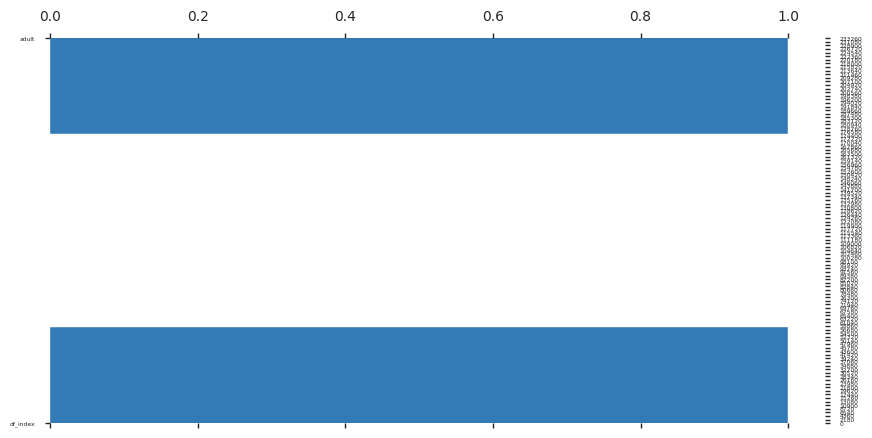

In [15]:
ProfileReport(df_bis)

In [72]:
df_bis.head(10)

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,prod_country_Sweden,prod_country_Switzerland,prod_country_Taiwan,prod_country_Turkey,prod_country_Ukraine,prod_country_United Arab Emirates,prod_country_United Kingdom,prod_country_United States of America,prod_country_Vietnam,prod_country_nan
0,False,/eNI7PtK6DEYgZmHWP9gQNuff8pv.jpg,The Matrix Collection,190000000,"Science Fiction , Action , Adventure",https://www.whatisthematrix.com,624860,tt10838180,en,The Matrix Resurrections,...,0,0,0,0,0,0,0,1,0,0
1,False,/l4QHerTSbMI7qgvasqxP36pqjN6.jpg,The Matrix Collection,63000000,"Action , Science Fiction",http://www.warnerbros.com/matrix,603,tt0133093,en,The Matrix,...,0,0,0,0,0,0,0,1,0,0
2,False,/pxK1iK6anS6erGg4QePmMKbB1E7.jpg,The Matrix Collection,150000000,"Adventure , Action , Thriller , Science Fiction",NaN,604,tt0234215,en,The Matrix Reloaded,...,0,0,0,0,0,0,0,1,0,0
3,False,/533xAMhhVyjTy8hwMUFEt5TuDfR.jpg,The Matrix Collection,150000000,"Adventure , Action , Thriller , Science Fiction",NaN,605,tt0242653,en,The Matrix Revolutions,...,0,0,0,0,0,0,0,1,0,0
4,False,/xLDSKsyAGFFCNYDmNynEOsms5jp.jpg,NaN,50000000,"Family , Fantasy , Adventure",NaN,13764,tt0089961,en,Santa Claus: The Movie,...,0,0,0,0,0,0,0,1,0,0
6,False,/jArl1j9sL2mYjRW23EaZKWAr2E8.jpg,NaN,25300000,"History , Drama , Thriller",NaN,399121,tt2398149,fr,J'accuse,...,0,0,0,0,0,0,0,0,0,0
8,False,/puJKgNcWaGgMk5VHanSSomUTpmw.jpg,Cinderella Collection,2900000,"Family , Fantasy , Animation , Romance",http://movies.disney.com/cinderella-1950,11224,tt0042332,en,Cinderella,...,0,0,0,0,0,0,0,1,0,0
9,False,/q7vmCCmyiHnuKGMzHZlr0fD44b9.jpg,NaN,95000000,"Romance , Fantasy , Family , Drama",http://movies.disney.com/cinderella,150689,tt1661199,en,Cinderella,...,0,0,0,0,0,0,1,1,0,0
11,False,/yqYFw9jDmtzIXJ1D6ebVIuJgJUE.jpg,Cinderella Story Collection,19000000,"Comedy , Family , Romance",https://www.warnerbros.com/movies/cinderella-s...,11247,tt0356470,en,A Cinderella Story,...,0,0,0,0,0,0,0,1,0,0
12,False,/40PwKtiXIZhHS1NmDko6h8EA391.jpg,NaN,88000000,"Romance , Drama , History",http://www.cinderellamanmovie.com/index.php,921,tt0352248,en,Cinderella Man,...,0,0,0,0,0,0,0,1,0,0


In [75]:
df_bis['prod_country_United States of America'].sum()/df_bis['prod_country_United States of America'].count()*100

88.34862385321101

In [16]:
df_bis

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,prod_country_Sweden,prod_country_Switzerland,prod_country_Taiwan,prod_country_Turkey,prod_country_Ukraine,prod_country_United Arab Emirates,prod_country_United Kingdom,prod_country_United States of America,prod_country_Vietnam,prod_country_nan
0,False,/eNI7PtK6DEYgZmHWP9gQNuff8pv.jpg,The Matrix Collection,190000000,"Science Fiction , Action , Adventure",https://www.whatisthematrix.com,624860,tt10838180,en,The Matrix Resurrections,...,0,0,0,0,0,0,0,1,0,0
1,False,/l4QHerTSbMI7qgvasqxP36pqjN6.jpg,The Matrix Collection,63000000,"Action , Science Fiction",http://www.warnerbros.com/matrix,603,tt0133093,en,The Matrix,...,0,0,0,0,0,0,0,1,0,0
2,False,/pxK1iK6anS6erGg4QePmMKbB1E7.jpg,The Matrix Collection,150000000,"Adventure , Action , Thriller , Science Fiction",NaN,604,tt0234215,en,The Matrix Reloaded,...,0,0,0,0,0,0,0,1,0,0
3,False,/533xAMhhVyjTy8hwMUFEt5TuDfR.jpg,The Matrix Collection,150000000,"Adventure , Action , Thriller , Science Fiction",NaN,605,tt0242653,en,The Matrix Revolutions,...,0,0,0,0,0,0,0,1,0,0
4,False,/xLDSKsyAGFFCNYDmNynEOsms5jp.jpg,NaN,50000000,"Family , Fantasy , Adventure",NaN,13764,tt0089961,en,Santa Claus: The Movie,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2848,False,/hUPgIibqZlwbhs4N08cPzzc4f5K.jpg,X-Men Collection,250000000,"Action , Adventure , Science Fiction",https://www.20thcenturystudios.com/movies/x-me...,127585,tt1877832,en,X-Men: Days of Future Past,...,0,0,0,0,0,0,0,1,0,0
2849,False,/2ZuNdBOSUamCo6mU1Ew1KEaN8Zc.jpg,The X Files Collection,66000000,"Mystery , Science Fiction , Thriller",NaN,846,tt0120902,en,The X Files,...,0,0,0,0,0,0,0,1,0,0
2850,False,/kC0QK1s6kx6jTxzPPaWwo3BRRr6.jpg,NaN,18000000,"Drama , Comedy",NaN,18410,tt0093793,en,Project X,...,0,0,0,0,0,0,0,1,0,0
2851,False,/4JO4qqCWh5BAfFwphC7ZAnhsM0.jpg,F/X Collection,10000000,"Action , Thriller",NaN,9873,tt0089118,en,F/X,...,0,0,0,0,0,0,0,1,0,0


In [20]:
df_bis[df_bis['belongs_to_collection']=='NaN']

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,prod_country_Sweden,prod_country_Switzerland,prod_country_Taiwan,prod_country_Turkey,prod_country_Ukraine,prod_country_United Arab Emirates,prod_country_United Kingdom,prod_country_United States of America,prod_country_Vietnam,prod_country_nan


In [22]:
df_bis[pd.notnull(df_bis['belongs_to_collection'])]

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,prod_country_Sweden,prod_country_Switzerland,prod_country_Taiwan,prod_country_Turkey,prod_country_Ukraine,prod_country_United Arab Emirates,prod_country_United Kingdom,prod_country_United States of America,prod_country_Vietnam,prod_country_nan
0,False,/eNI7PtK6DEYgZmHWP9gQNuff8pv.jpg,The Matrix Collection,190000000,"Science Fiction , Action , Adventure",https://www.whatisthematrix.com,624860,tt10838180,en,The Matrix Resurrections,...,0,0,0,0,0,0,0,1,0,0
1,False,/l4QHerTSbMI7qgvasqxP36pqjN6.jpg,The Matrix Collection,63000000,"Action , Science Fiction",http://www.warnerbros.com/matrix,603,tt0133093,en,The Matrix,...,0,0,0,0,0,0,0,1,0,0
2,False,/pxK1iK6anS6erGg4QePmMKbB1E7.jpg,The Matrix Collection,150000000,"Adventure , Action , Thriller , Science Fiction",NaN,604,tt0234215,en,The Matrix Reloaded,...,0,0,0,0,0,0,0,1,0,0
3,False,/533xAMhhVyjTy8hwMUFEt5TuDfR.jpg,The Matrix Collection,150000000,"Adventure , Action , Thriller , Science Fiction",NaN,605,tt0242653,en,The Matrix Revolutions,...,0,0,0,0,0,0,0,1,0,0
8,False,/puJKgNcWaGgMk5VHanSSomUTpmw.jpg,Cinderella Collection,2900000,"Family , Fantasy , Animation , Romance",http://movies.disney.com/cinderella-1950,11224,tt0042332,en,Cinderella,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2840,False,/pCssRYbILVduCYDgrcRG0T8W4FN.jpg,X-Men Collection,178000000,"Action , Adventure , Science Fiction , Fantasy",https://family.20thcenturystudios.com/movies/x...,246655,tt3385516,en,X-Men: Apocalypse,...,0,0,0,0,0,0,0,1,0,0
2841,False,/e1zfnkOBvGBeydFWCXFuTp9o8KW.jpg,Friday the 13th Collection,11000000,"Horror , Science Fiction",NaN,11470,tt0211443,en,Jason X,...,0,0,0,0,0,0,0,1,0,0
2848,False,/hUPgIibqZlwbhs4N08cPzzc4f5K.jpg,X-Men Collection,250000000,"Action , Adventure , Science Fiction",https://www.20thcenturystudios.com/movies/x-me...,127585,tt1877832,en,X-Men: Days of Future Past,...,0,0,0,0,0,0,0,1,0,0
2849,False,/2ZuNdBOSUamCo6mU1Ew1KEaN8Zc.jpg,The X Files Collection,66000000,"Mystery , Science Fiction , Thriller",NaN,846,tt0120902,en,The X Files,...,0,0,0,0,0,0,0,1,0,0


### On crée une nouvelle variable b_to_c qui vaut 1 ou 0 en fonction de si le film appartient à une collection ou pas 

In [29]:
df_bis['b_to_c']=pd.notnull(df_bis['belongs_to_collection']) #devient True et False
df_bis['b_to_c']=df_bis['b_to_c'].apply( lambda x : int(x))
df_bis

/var/folders/ls/kz9r5k393xg8d3p1krqjx50m0000gn/T/ipykernel_20157/1409474741.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bis['b_to_c']=pd.notnull(df_bis['belongs_to_collection']) #devient True et False
/var/folders/ls/kz9r5k393xg8d3p1krqjx50m0000gn/T/ipykernel_20157/1409474741.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bis['b_to_c']=df_bis['b_to_c'].apply( lambda x : int(x))


,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,prod_country_Switzerland,prod_country_Taiwan,prod_country_Turkey,prod_country_Ukraine,prod_country_United Arab Emirates,prod_country_United Kingdom,prod_country_United States of America,prod_country_Vietnam,prod_country_nan,b_to_c
0,False,/eNI7PtK6DEYgZmHWP9gQNuff8pv.jpg,The Matrix Collection,190000000,"Science Fiction , Action , Adventure",https://www.whatisthematrix.com,624860,tt10838180,en,The Matrix Resurrections,...,0,0,0,0,0,0,1,0,0,1
1,False,/l4QHerTSbMI7qgvasqxP36pqjN6.jpg,The Matrix Collection,63000000,"Action , Science Fiction",http://www.warnerbros.com/matrix,603,tt0133093,en,The Matrix,...,0,0,0,0,0,0,1,0,0,1
2,False,/pxK1iK6anS6erGg4QePmMKbB1E7.jpg,The Matrix Collection,150000000,"Adventure , Action , Thriller , Science Fiction",NaN,604,tt0234215,en,The Matrix Reloaded,...,0,0,0,0,0,0,1,0,0,1
3,False,/533xAMhhVyjTy8hwMUFEt5TuDfR.jpg,The Matrix Collection,150000000,"Adventure , Action , Thriller , Science Fiction",NaN,605,tt0242653,en,The Matrix Revolutions,...,0,0,0,0,0,0,1,0,0,1
4,False,/xLDSKsyAGFFCNYDmNynEOsms5jp.jpg,NaN,50000000,"Family , Fantasy , Adventure",NaN,13764,tt0089961,en,Santa Claus: The Movie,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2848,False,/hUPgIibqZlwbhs4N08cPzzc4f5K.jpg,X-Men Collection,250000000,"Action , Adventure , Science Fiction",https://www.20thcenturystudios.com/movies/x-me...,127585,tt1877832,en,X-Men: Days of Future Past,...,0,0,0,0,0,0,1,0,0,1
2849,False,/2ZuNdBOSUamCo6mU1Ew1KEaN8Zc.jpg,The X Files Collection,66000000,"Mystery , Science Fiction , Thriller",NaN,846,tt0120902,en,The X Files,...,0,0,0,0,0,0,1,0,0,1
2850,False,/kC0QK1s6kx6jTxzPPaWwo3BRRr6.jpg,NaN,18000000,"Drama , Comedy",NaN,18410,tt0093793,en,Project X,...,0,0,0,0,0,0,1,0,0,0
2851,False,/4JO4qqCWh5BAfFwphC7ZAnhsM0.jpg,F/X Collection,10000000,"Action , Thriller",NaN,9873,tt0089118,en,F/X,...,0,0,0,0,0,0,1,0,0,1
